## PVNet LineMod

参照: [PVNet-data_utils](https://github.com/zju3dv/pvnet/blob/master/lib/utils/data_utils.py)

In [1]:
import os
import sys
sys.path.append('.')
sys.path.append('..')
sys.path.append('../../')

import numpy as np
#from PIL import Image, ImageFile
#from plyfile import PlyData

from config.config import cfg
#from src.utils.draw_utils import write_points

In [2]:
from PVNetLineModModelDB import LineModModelDB
from src.utils.base_utils import read_pickle, Projector

In [3]:
class LineModImageDB(object):
    '''
    rgb_pth relative path to cfg.LINEMOD
    dpt_pth relative path to cfg.LINEMOD
    RT np.float32 [3,4]
    object_typ 'cat' ...
    rnd_typ 'real' or 'render'
    corner  np.float32 [8,2]
    '''
    def __init__(self,
                              object_name,
                              render_num: int = 10000,
                              fuse_num: int = 10000,
                              ms_num: int = 10000,
                              has_render_set=True,
                              has_fuse_set=True):

        self.linemod_dir=cfg.LINEMOD_DIR
        self.pvnet_linemod_dir = cfg.PVNET_LINEMOD_DIR

        self.object_name=object_name
        # some dirs for processing
        os.path.join(self.pvnet_linemod_dir ,
                                   'posedb',
                                   '{}_render.pkl'.format(object_name))
        self.render_dir='renders/{}'.format(object_name)
        self.rgb_dir='{}/JPEGImages'.format(object_name)
        self.mask_dir='{}/mask'.format(object_name)
        self.rt_dir=os.path.join(cfg.DATA_DIR,'LINEMOD_ORIG',object_name,'data')
        self.render_num=render_num

        self.test_fn='{}/test.txt'.format(object_name)
        self.train_fn='{}/train.txt'.format(object_name)
        self.val_fn='{}/val.txt'.format(object_name)

        if has_render_set:
            self.render_pkl=os.path.join(self.linemod_dir,'posedb','{}_render.pkl'.format(object_name))
            # prepare dataset
            if os.path.exists(self.render_pkl):
                # read cached
                self.render_set=read_pickle(self.render_pkl)
            else:
                # process render set
                self.render_set=self.collect_render_set_info(self.render_pkl,self.render_dir)
        else:
            self.render_set=[]

        self.real_pkl=os.path.join(self.linemod_dir,'posedb','{}_real.pkl'.format(object_name))
        if os.path.exists(self.real_pkl):
            # read cached
            self.real_set=read_pickle(self.real_pkl)
        else:
            # process real set
            self.real_set=self.collect_real_set_info()

            # prepare train test split
            self.train_real_set=[]
            self.test_real_set=[]
            self.val_real_set=[]
            self.collect_train_val_test_info()

            self.fuse_set=[]
            self.fuse_dir='fuse'
            self.fuse_num=fuse_num
            self.object_idx=cfg.linemod_object_names.index(object_name)

            if has_fuse_set:
                self.fuse_pkl=os.path.join(cfg.LINEMOD,'posedb','{}_fuse.pkl'.format(object_name))
                # prepare dataset
                if os.path.exists(self.fuse_pkl):
                    # read cached
                    self.fuse_set=read_pickle(self.fuse_pkl)
                else:
                    # process render set
                    self.fuse_set=self.collect_fuse_info()
            else:
                self.fuse_set=[]


    def collect_render_set_info(self,
                                                               pkl_file,
                                                               render_dir,
                                                               format='jpg'):
        """
        Blender 上の座標系に変更した LineMod オブジェクトの情報を読み出すための関数．

        
        """
        database=[]
        projector=Projector()
        modeldb=LineModModelDB()
        for k in range(self.render_num):
            data={}
            data['rgb_pth'] = os.path.join(render_dir, '{}.{}'.format(k, format))
            data['dpt_pth'] = os.path.join(render_dir, '{}_depth.png'.format(k))
            data['RT'] = read_pickle(os.path.join(self.linemod_dir,
                                                                                         render_dir,
                                                                                         '{}_RT.pkl'.format(k)))['RT']
            data['object_typ'] = self.object_name
            data['rnd_typ'] = 'render'
            data['corners'] = projector.project(modeldb.get_corners_3d(self.object_name),
                                                                                   data['RT'],
                                                                                   'blender')
            data['farthest'] = projector.project(modeldb.get_farthest_3d(self.object_name),
                                                                                    data['RT'],
                                                                                    'blender')
            data['center'] = projector.project(modeldb.get_centers_3d(self.object_name)[None,:],
                                                                                 data['RT'],
                                                                                 'blender')
            for num in [4,12,16,20]:
                data['farthest{}'.format(num)]=projector.project(modeldb.get_farthest_3d(self.object_name,num),data['RT'],'blender')
            data['small_bbox'] = projector.project(modeldb.get_small_bbox(self.object_name), data['RT'], 'blender')
            axis_direct=np.concatenate([np.identity(3), np.zeros([3, 1])], 1).astype(np.float32)
            data['van_pts']=projector.project_h(axis_direct, data['RT'], 'blender')
            database.append(data)

        save_pickle(database,pkl_file)
        return database

## インスタンス生成

In [4]:
object_name = "ape"

db = LineModImageDB(object_name=object_name)

FileNotFoundError: [Errno 2] No such file or directory: '/media/miki/DATA/My_programing/python/AI/Analysis/data/linemod/renders/ape/0_RT.pkl'

## 3D Plot 用ライブラリをロード

In [4]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

## corners_3d Test

In [5]:
object_name = 'ape'

corners_3d = db.get_corners_3d(object_name=object_name)
print('corners_3d = ')
print(corners_3d)
print('shape =', corners_3d.shape)

corners_3d = 
[[-0.03982  -0.04071  -0.035134]
 [-0.03982  -0.04071   0.056635]
 [-0.03982   0.036889 -0.035134]
 [-0.03982   0.036889  0.056635]
 [ 0.036049 -0.04071  -0.035134]
 [ 0.036049 -0.04071   0.056635]
 [ 0.036049  0.036889 -0.035134]
 [ 0.036049  0.036889  0.056635]]
shape = (8, 3)


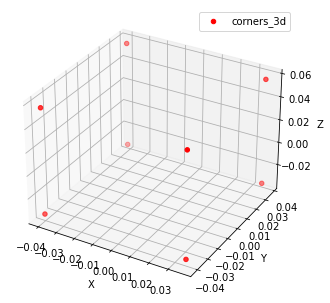

In [6]:
X_corners = []
Y_corners = []
Z_corners = []

for value in corners_3d:
    X_corners.append(value[0])
    Y_corners.append(value[1])
    Z_corners.append(value[2])

# グラフの枠を作成
fig = plt.figure()
ax = Axes3D(fig)

# X,Y,Z軸にラベルを設定
ax.set_xlabel("X")
ax.set_ylabel("Y")
ax.set_zlabel("Z")

# .scatterで描画
ax.scatter(X_corners,
                      Y_corners,
                      Z_corners,
                      c="r",
                      marker="o",
                      label="corners_3d")

# 凡例を表示          
ax.legend()

# 最後に.show()を書いてグラフ表示
plt.show()

## get_small_bbox Test

In [7]:
object_name = 'ape'

small_bbox = db.get_small_bbox(object_name=object_name)
print('small_bbox= ')
print(small_bbox)
print('shape =', small_bbox.shape)

small_bbox= 
[[-0.02717517 -0.02777683 -0.01983917]
 [-0.02717517 -0.02777683  0.04134017]
 [-0.02717517  0.02395584 -0.01983917]
 [-0.02717517  0.02395584  0.04134017]
 [ 0.02340417 -0.02777683 -0.01983917]
 [ 0.02340417 -0.02777683  0.04134017]
 [ 0.02340417  0.02395584 -0.01983917]
 [ 0.02340417  0.02395584  0.04134017]]
shape = (8, 3)


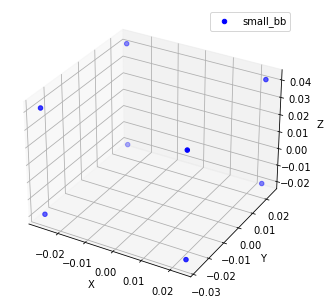

In [8]:
X_small_bb = []
Y_small_bb = []
Z_small_bb = []

for value in small_bbox:
    X_small_bb.append(value[0])
    Y_small_bb.append(value[1])
    Z_small_bb.append(value[2])

# グラフの枠を作成
fig = plt.figure()
ax = Axes3D(fig)

# X,Y,Z軸にラベルを設定
ax.set_xlabel("X")
ax.set_ylabel("Y")
ax.set_zlabel("Z")

# .scatterで描画
ax.scatter(X_small_bb,
                      Y_small_bb,
                      Z_small_bb,
                      c="b",
                      marker="o",
                      label="small_bb")

# 凡例を表示          
ax.legend()

# 最後に.show()を書いてグラフ表示
plt.show()

## get_ply_mode Test

In [9]:
object_name = 'ape'

ply_model = db.get_ply_model(object_name=object_name)
print('ply_model= ')
print(ply_model)
print('shape =', ply_model.shape)

ply_model= 
[[-0.031255  0.026196  0.002885]
 [-0.031445  0.027321  0.001013]
 [-0.032168  0.025672  0.001107]
 ...
 [ 0.008632  0.02086   0.021937]
 [ 0.006388  0.02136   0.022042]
 [ 0.007444  0.020054  0.023583]]
shape = (35034, 3)


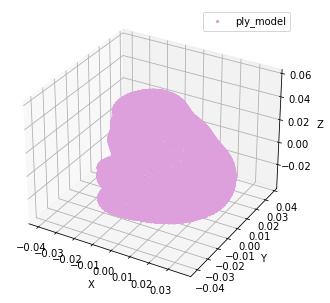

In [10]:
X_ply_model = []
Y_ply_model = []
Z_ply_model = []

for value in ply_model:
    X_ply_model.append(value[0])
    Y_ply_model.append(value[1])
    Z_ply_model.append(value[2])

# グラフの枠を作成
fig = plt.figure()
ax = Axes3D(fig)

# X,Y,Z軸にラベルを設定
ax.set_xlabel("X")
ax.set_ylabel("Y")
ax.set_zlabel("Z")

# .scatterで描画
ax.scatter(X_ply_model,
                      Y_ply_model,
                      Z_ply_model,
                      s=5,
                      c="plum",
                      marker="o",
                      label="ply_model")

# 凡例を表示          
ax.legend()

# 最後に.show()を書いてグラフ表示
plt.show()

## get_diameter Test

In [11]:
object_name = 'ape'

diameter = db.get_diameter(object_name=object_name)
print('diameter= ')
print(diameter)
print('shape =', diameter.shape)

diameter= 
0.0974298
shape = ()


## get_farthest_3d Test

In [12]:
object_name = 'ape'

farthest_3d = db.get_farthest_3d(object_name=object_name)
print('farthest_3d= ')
print(farthest_3d)
print('shape =', farthest_3d.shape)

farthest_3d= 
[[-0.03792221  0.01317253 -0.03416056]
 [ 0.02848666  0.00491138 -0.03187334]
 [-0.00862381 -0.02379927 -0.0301636 ]
 [ 0.00298642 -0.00625645  0.0564402 ]
 [-0.00201831  0.03437496 -0.01633792]
 [ 0.00124573 -0.0402041   0.00396196]
 [-0.03087807  0.02117801  0.00396745]
 [ 0.02564739  0.01924767  0.00104058]]
shape = (8, 3)


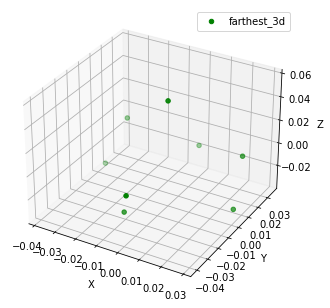

In [13]:
X_farthest = []
Y_farthest = []
Z_farthest = []

for value in farthest_3d:
    X_farthest.append(value[0])
    Y_farthest.append(value[1])
    Z_farthest.append(value[2])

# グラフの枠を作成
fig = plt.figure()
ax = Axes3D(fig)

# X,Y,Z軸にラベルを設定
ax.set_xlabel("X")
ax.set_ylabel("Y")
ax.set_zlabel("Z")

# .scatterで描画
ax.scatter(X_farthest,
                      Y_farthest,
                      Z_farthest,
                      c="g",
                      marker="o",
                      label="farthest_3d")

# 凡例を表示          
ax.legend()

# 最後に.show()を書いてグラフ表示
plt.show()

## get_ply_mesh Test

In [14]:
object_name = 'ape'

ply_mesh = db.get_ply_mesh(object_name=object_name)
print('ply_mesh= ')
print(ply_mesh)
print('len =', len(ply_mesh))
print('shape =', ply_mesh[0].shape)
print('shape =', ply_mesh[1].shape)

ply_mesh= 
(array([[-0.031255,  0.026196,  0.002885],
       [-0.031445,  0.027321,  0.001013],
       [-0.032168,  0.025672,  0.001107],
       ...,
       [ 0.008632,  0.02086 ,  0.021937],
       [ 0.006388,  0.02136 ,  0.022042],
       [ 0.007444,  0.020054,  0.023583]], dtype=float32), array([[    0,     1,     2],
       [    3,     4,     5],
       [    6,     7,     8],
       ...,
       [35025, 35026, 35027],
       [35028, 35029, 35030],
       [35031, 35032, 35033]]))
len = 2
shape = (35034, 3)
shape = (11678, 3)


## すべての 3d plot を重ねた図を作成

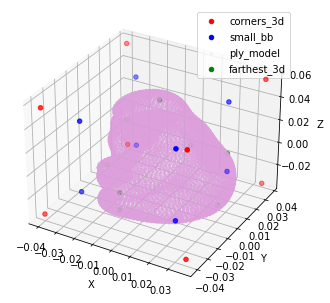

In [15]:
# グラフの枠を作成
fig = plt.figure()
ax = Axes3D(fig)

# X,Y,Z軸にラベルを設定
ax.set_xlabel("X")
ax.set_ylabel("Y")
ax.set_zlabel("Z")

# corners_3d
ax.scatter(X_corners,
                      Y_corners,
                      Z_corners,
                      c="r",
                      marker="o",
                      label="corners_3d")

# small_bb
ax.scatter(X_small_bb,
                      Y_small_bb,
                      Z_small_bb,
                      c="b",
                      marker="o",
                      label="small_bb")

# ply_model
ax.scatter(X_ply_model,
                      Y_ply_model,
                      Z_ply_model,
                      s=5,
                      c="plum",
                      marker="o",
                      alpha=0.1,
                      label="ply_model")

# farthest_3d
ax.scatter(X_farthest,
                      Y_farthest,
                      Z_farthest,
                      c="g",
                      marker="o",
                      label="farthest_3d")

# 凡例を表示          
ax.legend()

# 最後に.show()を書いてグラフ表示
plt.show()